# download data from kaggle

In [1]:
! pip install -q kaggle

In [17]:
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"rachanpanyakiattikun","key":"8753afb74d8e0ddf5508ef1936983155"}'}

In [18]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [19]:
! cp kaggle.json ~/.kaggle/

In [20]:
! chmod 600 ~/.kaggle/kaggle.json

In [21]:
!kaggle datasets download -d devvret/brazil-real-estate-listings

 97% 218M/225M [00:02<00:00, 85.6MB/s]
100% 225M/225M [00:02<00:00, 90.6MB/s]


In [22]:
!unzip /content/brazil-real-estate-listings.zip -d /content

Archive:  /content/brazil-real-estate-listings.zip
  inflating: /content/properati-real-estate-listings-brazil/data/properati_br_2016_11_01_properties_rent.csv  
  inflating: /content/properati-real-estate-listings-brazil/datapackage.json  
  inflating: /content/properati-real-estate-listings-brazil/original/properati-BR-2016-11-01-properties-rent.csv  
  inflating: /content/properati-real-estate-listings-brazil/original/properati-BR-2016-11-01-properties-sell.csv  


# Libraries

In [258]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge

# Clean Data

Cleaning data by
1. Drop columns that have NaN values more than 70%
2. Drop NaN values
3. Drop outliers and high leverage points
4. Drop low or high cardinality features
5. Drop leaky features
6. Check multicolinearity

In [2]:
df = pd.read_csv('/content/properati-real-estate-listings-brazil/original/properati-BR-2016-11-01-properties-sell.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 872672 entries, 0 to 872671
Data columns (total 24 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   created_on                  872672 non-null  object 
 1   operation                   872672 non-null  object 
 2   property_type               872672 non-null  object 
 3   place_name                  872672 non-null  object 
 4   place_with_parent_names     872672 non-null  object 
 5   geonames_id                 140 non-null     float64
 6   lat-lon                     387227 non-null  object 
 7   lat                         387227 non-null  float64
 8   lon                         387227 non-null  float64
 9   price                       819401 non-null  float64
 10  currency                    819382 non-null  object 
 11  price_aprox_local_currency  819401 non-null  float64
 12  price_aprox_usd             819401 non-null  float64
 13  surface_total_

In [4]:
bl = ([df.isnull().sum()/len(df)>0.7])

In [5]:
# drop columns which have "NaN" values more than 70%
df.drop(columns=df.columns[bl], inplace=True)
# drop "NaN" values
df.dropna(inplace=True)

df.info()

/usr/local/lib/python3.9/dist-packages/pandas/core/indexes/base.py:5069: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  result = getitem(key)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 161858 entries, 792 to 872667
Data columns (total 20 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   created_on                  161858 non-null  object 
 1   operation                   161858 non-null  object 
 2   property_type               161858 non-null  object 
 3   place_name                  161858 non-null  object 
 4   place_with_parent_names     161858 non-null  object 
 5   lat-lon                     161858 non-null  object 
 6   lat                         161858 non-null  float64
 7   lon                         161858 non-null  float64
 8   price                       161858 non-null  float64
 9   currency                    161858 non-null  object 
 10  price_aprox_local_currency  161858 non-null  float64
 11  price_aprox_usd             161858 non-null  float64
 12  surface_covered_in_m2       161858 non-null  float64
 13  price_usd_pe

In [6]:
# plot location of the properties
fig = px.scatter_mapbox(
    df,  # Our DataFrame
    lat=df['lat'],
    lon=df['lon'],
    center={"lat": df['lat'].mean(), "lon": df['lon'].mean()},  # Map will be centered on Mexico City
    width=600,  # Width of map
    height=600,  # Height of map
    hover_data=["price_aprox_usd"],  # Display price when hovering mouse over house
)

fig.update_layout(mapbox_style="open-street-map")

fig.show()

In [7]:
# From the map above, we can see that there are some outliers that lie outside Brazil.
# Drop outliers
df = df[df['lat']<0]

In [12]:
df.select_dtypes('object').nunique()

created_on                    877
operation                       1
property_type                   4
place_name                   3124
place_with_parent_names      3761
lat-lon                     53332
currency                        2
properati_url              161742
description                140419
title                       96961
image_thumbnail            153948
dtype: int64

In [19]:
# Drop low or high cardinality features
df.drop(columns=['title', 'description', 'image_thumbnail', 'properati_url', 
                 'lat-lon', 'created_on', 'operation', 'currency', 'place_with_parent_names'], inplace=True)

In [9]:
# drop leaky features
df.drop(columns=['price', 'price_aprox_local_currency', 'price_usd_per_m2', 'price_per_m2'], inplace=True)

In [21]:
df.corr()

,lat,lon,price_aprox_usd,surface_covered_in_m2,rooms
lat,1.000000,0.645415,-0.037006,-0.000156,0.048510
lon,0.645415,1.000000,0.026393,-0.000070,0.041249
price_aprox_usd,-0.037006,0.026393,1.000000,0.024105,0.263780
surface_covered_in_m2,-0.000156,-0.000070,0.024105,1.000000,0.012013
rooms,0.048510,0.041249,0.263780,0.012013,1.000000


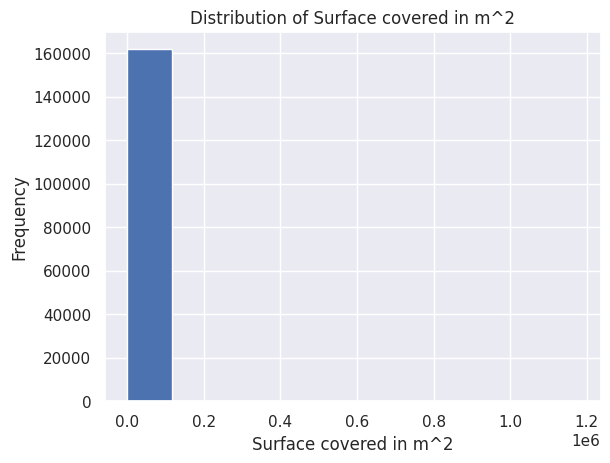

In [22]:
sns.set()
plt.hist(df['surface_covered_in_m2'])
plt.xlabel('Surface covered in m^2')
plt.ylabel('Frequency')
plt.title('Distribution of Surface covered in m^2');

Text(0.5, 1.0, 'Distribution of Home Sizes')

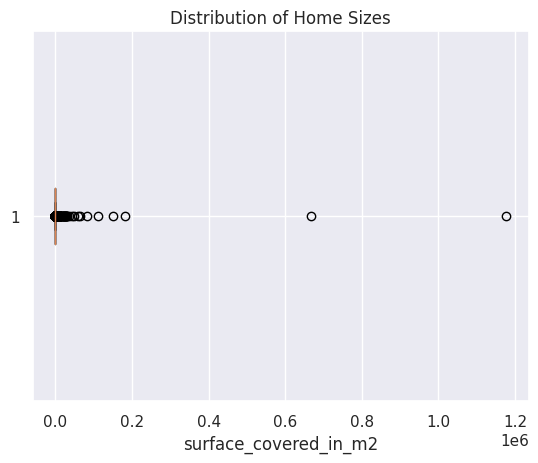

In [23]:
plt.boxplot(df['surface_covered_in_m2'], vert =False)
plt.xlabel('surface_covered_in_m2')
plt.title('Distribution of Home Sizes')

In [24]:
low = df['surface_covered_in_m2'].quantile(0.05)
high = df['surface_covered_in_m2'].quantile(0.95)
df= df[df['surface_covered_in_m2'].between(low, high)]

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 145890 entries, 794 to 872667
Data columns (total 7 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   property_type          145890 non-null  object 
 1   place_name             145890 non-null  object 
 2   lat                    145890 non-null  float64
 3   lon                    145890 non-null  float64
 4   price_aprox_usd        145890 non-null  float64
 5   surface_covered_in_m2  145890 non-null  float64
 6   rooms                  145890 non-null  float64
dtypes: float64(5), object(2)
memory usage: 8.9+ MB


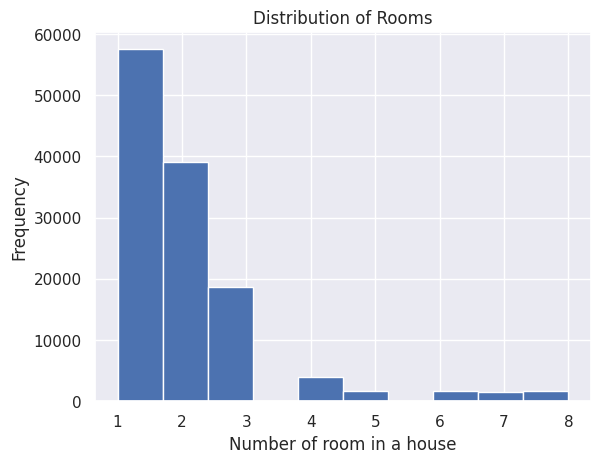

In [391]:
plt.hist(df['rooms'])
plt.xlabel('Number of room in a house')
plt.ylabel('Frequency')
plt.title('Distribution of Rooms');

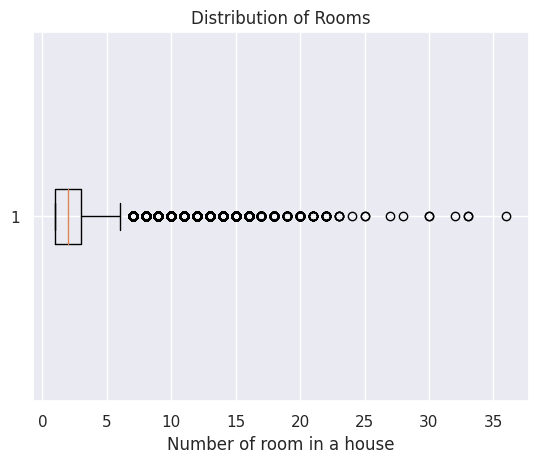

In [27]:
plt.boxplot(df['rooms'], vert =False)
plt.xlabel('Number of room in a house')
plt.title('Distribution of Rooms');

In [28]:
low = df['rooms'].quantile(0.05)
high = df['rooms'].quantile(0.95)
df= df[df['rooms'].between(low, high)]

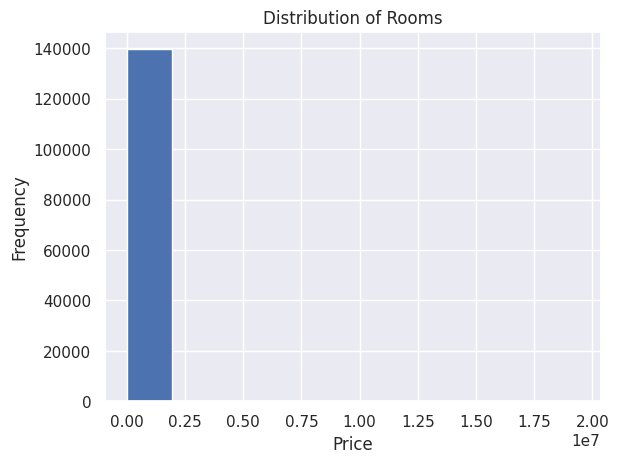

In [356]:
plt.hist(df['price_aprox_usd'])
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.title('Distribution of Rooms');

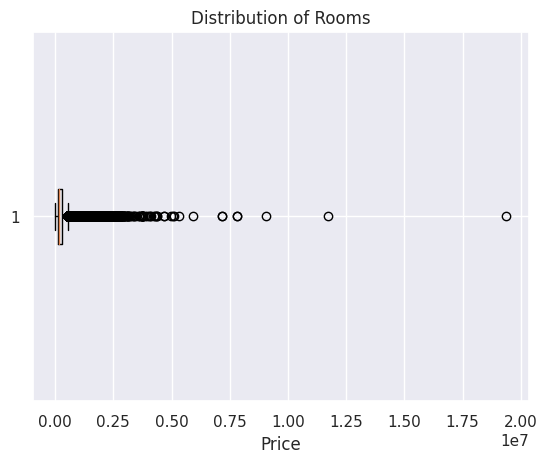

In [357]:
plt.boxplot(df['price_aprox_usd'], vert =False)
plt.xlabel('Price')
plt.title('Distribution of Rooms');

In [358]:
low = df['price_aprox_usd'].quantile(0.05)
high = df['price_aprox_usd'].quantile(0.95)
df= df[df['price_aprox_usd'].between(low, high)]

# Explore

<Axes: >

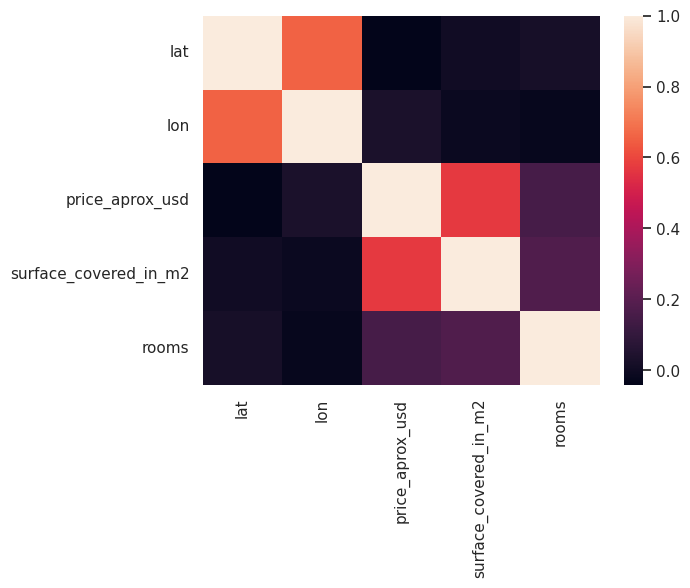

In [338]:
cor_mat = df.corr()
sns.heatmap(cor_mat)

Text(0.5, 1.0, 'Area vs Price')

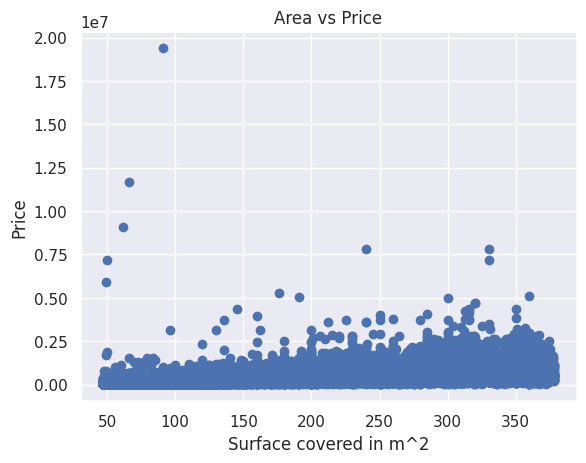

In [341]:
plt.scatter(df['surface_covered_in_m2'], df['price_aprox_usd'])
plt.xlabel('Surface covered in m^2')
plt.ylabel('Price')
plt.title('Area vs Price')

Text(0.5, 1.0, 'Area vs Price')

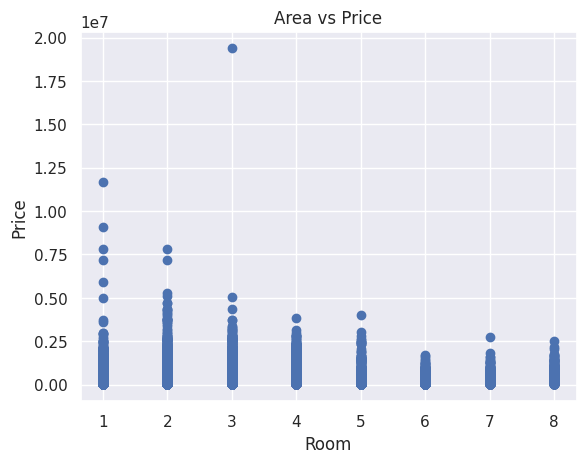

In [342]:
plt.scatter(df['rooms'], df['price_aprox_usd'])
plt.xlabel('Room')
plt.ylabel('Price')
plt.title('Area vs Price')

In [387]:
fig = px.scatter_mapbox(
    df,  # Our DataFrame
    lat=df['lat'],
    lon=df['lon'],
    width=600,  # Width of map
    height=600,  # Height of map
    color=df['price_aprox_usd'],
    hover_data=["price_aprox_usd"],  # Display price when hovering mouse over house
)

fig.update_layout(mapbox_style="open-street-map")

fig.show()

It may indicate that the house that reside the coast tend to have higher price.

# Train Test split

Since there are categorical and numerical features, we need to deal with it differently. For categorical features, we use OneHotEncoding to the features, but for numerical values, we standardize the features.

In [360]:
from sklearn.compose import make_column_selector as selector
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.preprocessing import OneHotEncoder, StandardScaler

In [361]:
numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(df.drop(columns='price_aprox_usd'))
categorical_columns = categorical_columns_selector(df)

In [362]:
def split_data(categorical_columns, numerical_columns, df):
  
  categorical_preprocessor = OneHotEncoder()
  numerical_preprocessor = StandardScaler()

  preprocessor = ColumnTransformer([
    ('one-hot-encoder', categorical_preprocessor, categorical_columns),
    ('standard_scaler', numerical_preprocessor, numerical_columns)])
  
  X = preprocessor.fit_transform(df.drop(columns='price_aprox_usd'))
  
  X_train, X_test, y_train, y_test = train_test_split(X, df['price_aprox_usd'], test_size=0.33, random_state=42)
  return X_train, X_test, y_train, y_test, preprocessor

In [363]:
X_train, X_test, y_train, y_test, preprocessor = split_data(categorical_columns, numerical_columns, df)

# Model

Create baseline model that is mean of the response, so the model we create should overcome this baseline

In [364]:
y_mean = y_train.mean()
y_baseline_train = [y_mean]*len(y_train)
y_baseline_test = [y_mean]*len(y_test)

In [365]:
mae_baseline_train = mean_absolute_error(y_train, y_baseline_train)
mae_baseline_test = mean_absolute_error(y_test, y_baseline_test)
print(f"MAE of training data: {mae_baseline_train} $")
print(f"MAE of test data: {mae_baseline_test} $")

MAE of training data: 97613.59419340643 $
MAE of test data: 98015.44994247485 $


Linear Regression Model

In [366]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [367]:
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

In [368]:
mae_reg_train = mean_absolute_error(y_train, y_pred_train)
mae_reg_test = mean_absolute_error(y_test, y_pred_test)
print(f"MAE of training data: {mae_reg_train} $")
print(f"MAE of test data: {mae_reg_test} $")

MAE of training data: 46931.06070933438 $
MAE of test data: 48859.6681504773 $


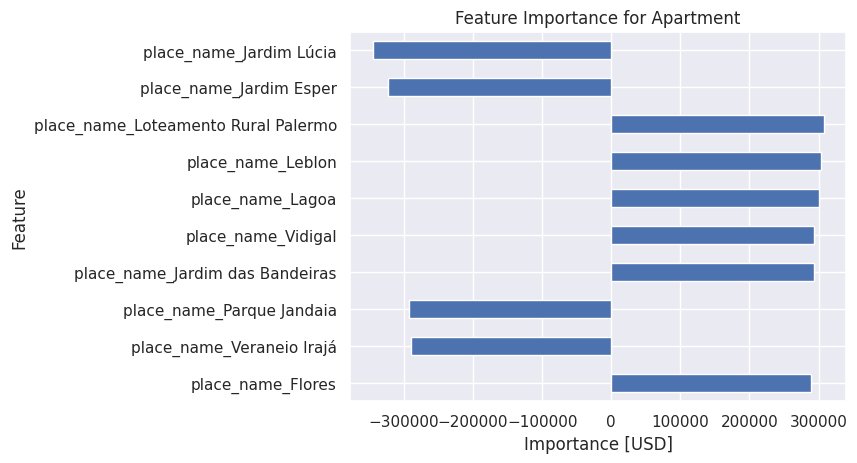

In [369]:
def feature_imp(model, preprocessor, numerical_columns):
  coefficients = model.coef_.round(2)
  features = preprocessor.transformers_[0][1].get_feature_names_out().tolist()  + numerical_columns
  feat_imp = pd.Series(coefficients, index=features)
  return feat_imp
def plot_fea(feat_imp):
  feat_imp.sort_values(key=abs)[-10:].plot(kind='barh')
  plt.xlabel('Importance [USD]')
  plt.ylabel('Feature')
  plt.title('Feature Importance for Apartment')
feat_imp = feature_imp(model, preprocessor, numerical_columns)
plot_fea(feat_imp)

In [370]:
df.groupby('place_name')['price_aprox_usd'].mean().sort_values(ascending=False)[:10]

place_name
Morro das Pedras                        624102.850
Gramado                                 596553.240
Residencial Eco Village I               588997.060
Loteamento Residencial Barão do Café    577295.130
Vila Hollândia                          561692.560
Chácara Granja Velha                    561692.560
Loteamento Rural Palermo                561692.560
Alphaville Dom Pedro                    558572.050
Algodoal                                546089.990
Jardim das Bandeiras                    540977.615
Name: price_aprox_usd, dtype: float64

In [371]:
print(f"Coefficient of lat: {feat_imp['lat']}")
print(f"Coefficient of lon: {feat_imp['lon']}")
print(f"Coefficient of surface_covered_in_m2: {feat_imp['surface_covered_in_m2']}")
print(f"Coefficient of rooms: {feat_imp['rooms']}")

Coefficient of lat: -26693.4
Coefficient of lon: 17196.54
Coefficient of surface_covered_in_m2: 85919.58
Coefficient of rooms: 1655.66


In [372]:
df.corr()

,lat,lon,price_aprox_usd,surface_covered_in_m2,rooms
lat,1.000000,0.667981,-0.024805,0.031491,0.008287
lon,0.667981,1.000000,0.026658,-0.023866,-0.038797
price_aprox_usd,-0.024805,0.026658,1.000000,0.576983,0.161449
surface_covered_in_m2,0.031491,-0.023866,0.576983,1.000000,0.143631
rooms,0.008287,-0.038797,0.161449,0.143631,1.000000


As we can see, for categorical features, if the average price of that feature is large, then the importance of this feature will be significant. For the numerical values, this has to do with correlation matrix. If the features has high correlation with response, the importance values or coefficient will be large.

# Change Features

From the first model, we can see that 'lat' and 'lon' features are not highly correlated with response, so maybe we should consider this predictors as categorical features.

In [373]:
categorical_columns = ['property_type', 'place_name', 'lat', 'lon']
numerical_columns = ['surface_covered_in_m2', 'rooms']

In [374]:
X_train, X_test, y_train, y_test, preprocessor = split_data(categorical_columns, numerical_columns, df)

In [375]:
model2 = LinearRegression()
model2.fit(X_train, y_train)

LinearRegression()

In [376]:
y_pred_train = model2.predict(X_train)
y_pred_test = model2.predict(X_test)
mae_reg2_train = mean_absolute_error(y_train, y_pred_train)
mae_reg2_test = mean_absolute_error(y_test, y_pred_test)
print(f"MAE of training data: {mae_reg2_train} $")
print(f"MAE of test data: {mae_reg2_test} $")

MAE of training data: 22997.272287468553 $
MAE of test data: 49250.93606672017 $


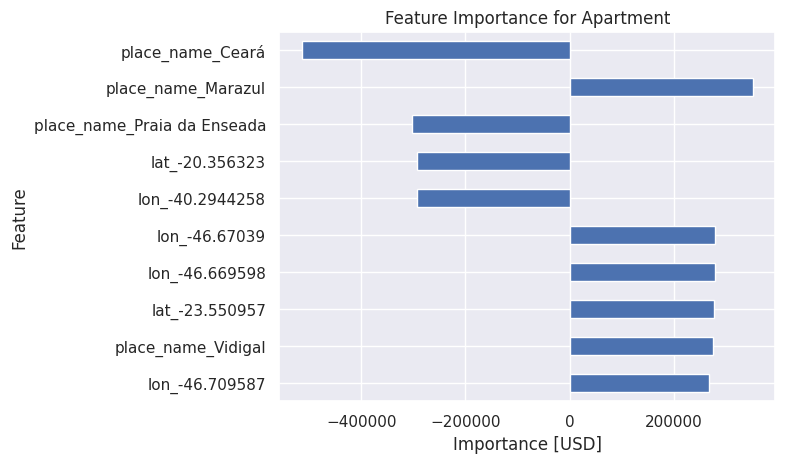

In [377]:
feat_imp = feature_imp(model2, preprocessor, numerical_columns)
plot_fea(feat_imp)

In [378]:
df.groupby('lat')['price_aprox_usd'].mean().sort_values(ascending=False)

lat
-23.607250    631273.27
-22.986900    631273.27
-23.629490    631273.27
-23.604950    631273.27
-23.013226    631273.27
                ...    
-23.934425     62098.23
-23.176556     62098.23
-15.864277     62098.23
-5.784515      62098.23
-22.896384     62098.23
Name: price_aprox_usd, Length: 40061, dtype: float64

In [379]:
df.groupby('lon')['price_aprox_usd'].mean().sort_values(ascending=False)

lon
-46.691316    631273.27
-46.678117    631273.27
-46.682629    631273.27
-46.656980    631273.27
-46.670390    631273.27
                ...    
-46.452922     62098.23
-47.509552     62098.23
-41.978489     62098.23
-49.187521     62098.23
-51.108894     62098.23
Name: price_aprox_usd, Length: 39467, dtype: float64

The results of this model have lower MAE for both train and test set, but there is a gap between the mae of these two values (training mae is lower than test mae very much). Hence, this occur overfitting. Furthermore, when we consider 'lat' and 'lon' as categorical, its importance is higher than the first model and higher than the place name.

# Change feature and model

To avoid overfitting, we can reguralize the model vy using ridge or lasso (make model sparse). For our purpose, we don't want the model to be sparse. So the ridge is chosen.

In [380]:
model3 = Ridge()
model3.fit(X_train, y_train)

Ridge()

In [381]:
y_pred_train = model3.predict(X_train)
y_pred_test = model3.predict(X_test)
mae_reg3_train = mean_absolute_error(y_train, y_pred_train)
mae_reg3_test = mean_absolute_error(y_test, y_pred_test)
print(f"MAE of training data: {mae_reg3_train} $")
print(f"MAE of test data: {mae_reg3_test} $")

MAE of training data: 28655.017139892392 $
MAE of test data: 42617.25382826879 $


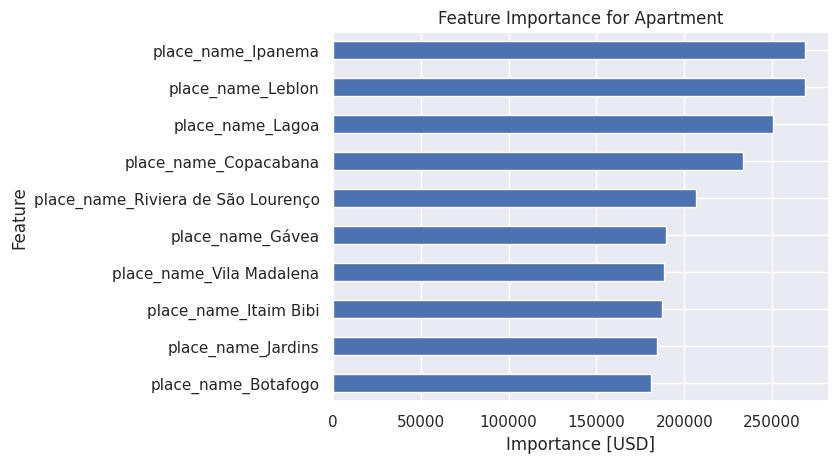

In [382]:
feat_imp = feature_imp(model3, preprocessor, numerical_columns)
plot_fea(feat_imp)

To improve this model, we can change the regularization parameter (α) observe the best performance which has the lowest test mae.

#Summary

In [383]:
mae = {'MAE_train': [mae_baseline_train, mae_reg_train, mae_reg2_train, mae_reg3_train],
             'MAE_test': [mae_baseline_test, mae_reg_test, mae_reg2_test, mae_reg3_test]}
summary = pd.DataFrame(mae)
summary.index = ['model_baseline', 'model_regression I', 'model_regression II', 'model_regression III']
summary

,MAE_train,MAE_test
model_baseline,97613.594193,98015.449942
model_regression I,46931.060709,48859.668150
model_regression II,22997.272287,49250.936067
model_regression III,28655.017140,42617.253828


In [384]:
df['price_aprox_usd'].describe()

count    126038.000000
mean     204236.764191
std      125162.316684
min       62098.230000
25%      109217.990000
50%      166947.510000
75%      265243.710000
max      631273.270000
Name: price_aprox_usd, dtype: float64

Text(0.5, 1.0, 'Distribution of Price')

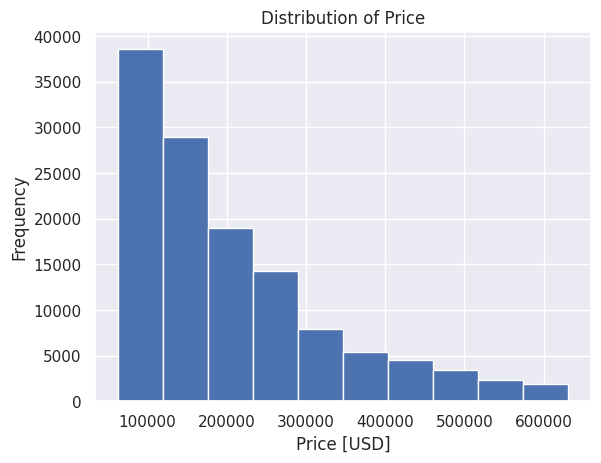

In [386]:
plt.hist(df['price_aprox_usd'])
plt.xlabel('Price [USD]')
plt.ylabel('Frequency')
plt.title('Distribution of Price')

To conclude, Firstly, we clean the data by considering "NaN" values, outliers, leaky features,  low or high cardinality features, multicolinearity problem. Secondly, we deal with categorical and numerical features. Finally, we fit the regression model and Ridge. And the results are acceptable since the models are better than the baseline model. To improve the result, we can use more complex model such as nueral network but it lose interpretability.